# *FASE DE ENTRENAMIENTO DE LA RED NEURONAL* 🧑‍💻🐍📊

# **1. CARGAR LIBRERIAS**

In [ ]:
!pip install -r dependencias.txt

In [1]:
import cv2
import numpy as np
import os
from matplotlib import pyplot as plt
import time
import mediapipe as mp
from sklearn.model_selection import train_test_split
from sklearn.metrics import multilabel_confusion_matrix,accuracy_score
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential,load_model
from tensorflow.keras.layers import LSTM,Dense
from tensorflow.keras.callbacks import TensorBoard

# **2. INICIALIZAR LOS MODELOS DE MEDIAPIPE**

In [2]:
mp_holistic = mp.solutions.holistic # inicia el modelo donde podemos seguir los puntos del cuerpo humano, incluyendo pose, mano y caras.
mp_drawing = mp.solutions.drawing_utils # inicializa el dibujado o trazados de los puntos del modelo.
mp_pose = mp.solutions.pose
mp_hands = mp.solutions.hands
mp_face_mesh = mp.solutions.face_mesh

# **3. ENTRENAMIENTOS REDES NEURONALES**

## 3.1 PRE-ENTRENAMIENTO WEBCAM (DATASET 1) - 3 SEÑAS SELECCIONADAS

### *3.1.1 INICIALIZACION DE VARIABLES*

In [3]:
DATA_PATH = os.path.join('MP_Data_Webcam')

Category: Conjunto de señas seleccionadas para el entrenamiento #1

In [4]:
category = {
    'ADJETIVOS':['FEO','BONITO','INTELIGENTE']
}

In [5]:
DATA_PATH = os.path.join('MP_Data_Webcam')
no_videos = 30
no_frames = 30

In [6]:
actions = np.array([value for values in category.values() for value in values])

In [7]:
label_map = {label:num for num, label in enumerate(actions)}

### *3.1.2 CARGAR LOS ARRAYS DE LAS SEÑAS SELECCIONADAS*

In [8]:
sequences, labels = [],[]
for action in actions:
    for sequence in range(no_videos):
        window = []
        for frame_num in range(no_frames):
            res = np.load(os.path.join(DATA_PATH,action,str(sequence),"{}.npy".format(frame_num)))
            print(os.path.join(DATA_PATH,action,str(sequence),"{}.npy".format(frame_num)))
            print(os.path.join(DATA_PATH,action,str(sequence),"{}.npy".format(frame_num)))
            window.append(res)
        sequences.append(window)
        labels.append(label_map[action])

MP_Data_Webcam\FEO\0\0.npy
MP_Data_Webcam\FEO\0\0.npy
MP_Data_Webcam\FEO\0\1.npy
MP_Data_Webcam\FEO\0\1.npy
MP_Data_Webcam\FEO\0\2.npy
MP_Data_Webcam\FEO\0\2.npy
MP_Data_Webcam\FEO\0\3.npy
MP_Data_Webcam\FEO\0\3.npy
MP_Data_Webcam\FEO\0\4.npy
MP_Data_Webcam\FEO\0\4.npy
MP_Data_Webcam\FEO\0\5.npy
MP_Data_Webcam\FEO\0\5.npy
MP_Data_Webcam\FEO\0\6.npy
MP_Data_Webcam\FEO\0\6.npy
MP_Data_Webcam\FEO\0\7.npy
MP_Data_Webcam\FEO\0\7.npy
MP_Data_Webcam\FEO\0\8.npy
MP_Data_Webcam\FEO\0\8.npy
MP_Data_Webcam\FEO\0\9.npy
MP_Data_Webcam\FEO\0\9.npy
MP_Data_Webcam\FEO\0\10.npy
MP_Data_Webcam\FEO\0\10.npy
MP_Data_Webcam\FEO\0\11.npy
MP_Data_Webcam\FEO\0\11.npy
MP_Data_Webcam\FEO\0\12.npy
MP_Data_Webcam\FEO\0\12.npy
MP_Data_Webcam\FEO\0\13.npy
MP_Data_Webcam\FEO\0\13.npy
MP_Data_Webcam\FEO\0\14.npy
MP_Data_Webcam\FEO\0\14.npy
MP_Data_Webcam\FEO\0\15.npy
MP_Data_Webcam\FEO\0\15.npy
MP_Data_Webcam\FEO\0\16.npy
MP_Data_Webcam\FEO\0\16.npy
MP_Data_Webcam\FEO\0\17.npy
MP_Data_Webcam\FEO\0\17.npy
MP_Data_Webc

In [ ]:
X = np.array(sequences)

Carga las etiquetas númericas en un formato One-Hot encoding, convierte las etiquetas de tipo int en boole.

In [ ]:
y = to_categorical(labels).astype(int)

In [ ]:
np.argmax(y, axis=1)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2], dtype=int64)

### *3.1.3 PROCESAMIENTO DE DATOS PARA ENTRENAMIENTO Y EVALUACION*

Se seleccionará en este entrenamiento el 20% del dataset para pruebas y el 80% para entrenamiento

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.20)

### *3.1.4 CREACION DE UN CALLBACK DE TENSORBOARD PARA VISUALIZAR LAS METRICAS DE ENTRENAMIENTO*

In [ ]:
log_dir = os.path.join('Entrenamientos')
os.makedirs(log_dir)

### *3.1.5 MODELO DE RED NEURONAL UTILIZADA*

In [ ]:
def cargar_modelo():
    model = None
    model = Sequential()
    model.add(LSTM(64,return_sequences=True,activation='relu',input_shape=(30,1662)))
    model.add(LSTM(128,return_sequences=True,activation='relu'))
    model.add(LSTM(64,return_sequences=False,activation='relu'))
    model.add(Dense(64,activation='relu'))
    model.add(Dense(32,activation='relu'))
    model.add(Dense(actions.shape[0],activation='softmax'))
    return model

### *3.1.6 CONFIGURACION Y PROCESO DE ENTRENAMIENTOS*

a. Entrenamiento con 500 épocas

In [ ]:
model = None
model = cargar_modelo()

In [ ]:
model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['categorical_accuracy'])

In [ ]:
log_dir = 'Entrenamientos/train1'
os.makedirs(log_dir)
tb_callback = TensorBoard(log_dir=log_dir)

In [ ]:
model.fit(X_train,y_train,epochs=500,callbacks=[tb_callback])

Epoch 1/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step - categorical_accuracy: 0.3368 - loss: 1.1104
Epoch 2/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - categorical_accuracy: 0.4062 - loss: 1.8154
Epoch 3/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - categorical_accuracy: 0.2708 - loss: 1.3782
Epoch 4/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - categorical_accuracy: 0.3438 - loss: 1.1643
Epoch 5/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - categorical_accuracy: 0.4635 - loss: 2.1340
Epoch 6/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - categorical_accuracy: 0.1332 - loss: 2.3566   
Epoch 7/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - categorical_accuracy: 0.3581 - loss: 1.1774
Epoch 8/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - categorical_accuracy: 0.3563 - loss: 1.1051
Epoch 9/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - categorical_accuracy: 0.3793 - loss: 1.0995
Epoch 10/500
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - categorical_accuracy: 0.5438 - loss: 1.1056
Epoch 11/500
3/3 ━━━━━━━━━━━━━━━━━━━

In [ ]:
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_15 (LSTM)                  │ (None, 30, 64)         │       442,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_16 (LSTM)                  │ (None, 30, 128)        │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_17 (LSTM)                  │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 3)              │            99 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,790,027 (6.83 MB)

 Trainable params: 596,675 (2.28 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,193,352 (4.55 MB)

In [ ]:
res = model.predict(X_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step


In [ ]:
loss, accuracy = model.evaluate(X_train, y_train)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - categorical_accuracy: 0.5946 - loss: 0.7887 


In [ ]:
loss, accuracy = model.evaluate(X_test, y_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - categorical_accuracy: 0.3333 - loss: 0.8948


In [ ]:
model.save('models/train1.h5')

In [ ]:
yhat = model.predict(X_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step


In [ ]:
ytrue = np.argmax(y_test,axis=1).tolist()
yhat = np.argmax(yhat,axis=1).tolist()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import multilabel_confusion_matrix
mcm = multilabel_confusion_matrix(ytrue, yhat)
l = list(set(labels))

ig, axes = plt.subplots(1, len(l), figsize=(15, 5))

for i, (ax, matrix) in enumerate(zip(axes, mcm)):
    sns.heatmap(matrix, annot=True, fmt="d", ax=ax, cmap="Blues")
    ax.set_title(f'Matriz de Confusión para "{actions[l[i]]}"')
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Valor Verdadero')

plt.tight_layout()
plt.show()

B. Entrenamiento con 1000 epocas

In [ ]:
model = None
model = cargar_modelo()

In [ ]:
model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['categorical_accuracy'])

In [ ]:
log_dir = 'Entrenamientos/train2'
os.makedirs(log_dir)
tb_callback = TensorBoard(log_dir=log_dir)

In [ ]:
model.fit(X_train,y_train,epochs=1000,callbacks=[tb_callback])

Epoch 1/1000
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step - categorical_accuracy: 0.2192 - loss: 3.0924
Epoch 2/1000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - categorical_accuracy: 0.3138 - loss: 1.1699
Epoch 3/1000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - categorical_accuracy: 0.3121 - loss: 8.0789
Epoch 4/1000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - categorical_accuracy: 0.3390 - loss: 11.2456
Epoch 5/1000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - categorical_accuracy: 0.4028 - loss: 5.4738
Epoch 6/1000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - categorical_accuracy: 0.3251 - loss: 11.8578
Epoch 7/1000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - categorical_accuracy: 0.2179 - loss: 21.3086
Epoch 8/1000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - categorical_accuracy: 0.3433 - loss: 17.2420
Epoch 9/1000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - categorical_accuracy: 0.4696 - loss: 7.2651
Epoch 10/1000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - categorical_accuracy: 0.5061 - loss: 7.2418
Epoch 11/1000
3/3 ━━━━━━━

In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 30, 64)         │       442,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 30, 128)        │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 3)              │            99 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 596,675 (2.28 MB)

 Trainable params: 596,675 (2.28 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
res = model.predict(X_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


In [ ]:
loss, accuracy = model.evaluate(X_train, y_train)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - categorical_accuracy: 0.9714 - loss: 0.2365 


In [ ]:
loss, accuracy = model.evaluate(X_test, y_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - categorical_accuracy: 0.8333 - loss: 0.3696


In [ ]:
model.save('models/train2.h5')

In [ ]:
yhat = model.predict(X_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


In [ ]:
ytrue = np.argmax(y_test,axis=1).tolist()
yhat = np.argmax(yhat,axis=1).tolist()

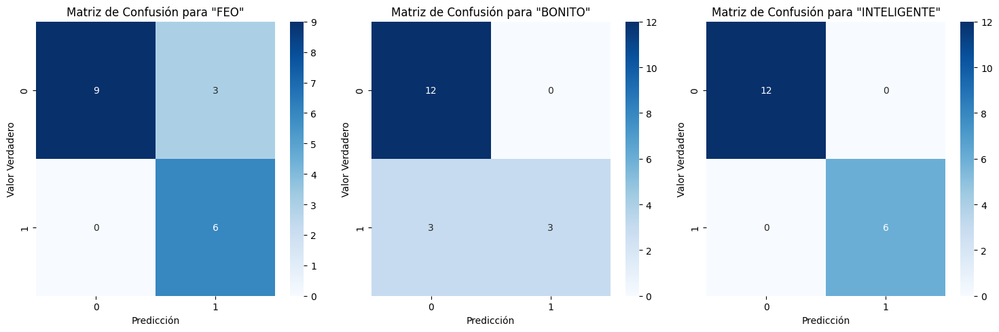

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import multilabel_confusion_matrix
mcm = multilabel_confusion_matrix(ytrue, yhat)
l = list(set(labels))

ig, axes = plt.subplots(1, len(l), figsize=(15, 5))

for i, (ax, matrix) in enumerate(zip(axes, mcm)):
    sns.heatmap(matrix, annot=True, fmt="d", ax=ax, cmap="Blues")
    ax.set_title(f'Matriz de Confusión para "{actions[l[i]]}"')
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Valor Verdadero')

plt.tight_layout()
plt.show()

C. Entrenamiento con 2000 epoca

In [ ]:
model = None
model = cargar_modelo()

In [ ]:
model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['categorical_accuracy'])

In [ ]:
log_dir = 'Entrenamientos/train2'
os.makedirs(log_dir)
tb_callback = TensorBoard(log_dir=log_dir)

In [ ]:
model.fit(X_train,y_train,epochs=2000,callbacks=[tb_callback])

Epoch 1/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - categorical_accuracy: 0.3767 - loss: 3.5383
Epoch 2/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - categorical_accuracy: 0.3976 - loss: 8.2368
Epoch 3/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - categorical_accuracy: 0.2951 - loss: 13.8547
Epoch 4/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - categorical_accuracy: 0.5312 - loss: 4.6831
Epoch 5/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - categorical_accuracy: 0.1480 - loss: 13.0934
Epoch 6/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - categorical_accuracy: 0.3199 - loss: 15.4083
Epoch 7/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - categorical_accuracy: 0.3633 - loss: 3.7104
Epoch 8/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - categorical_accuracy: 0.2826 - loss: 3.6081
Epoch 9/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - categorical_accuracy: 0.3381 - loss: 4.3332
Epoch 10/2000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - categorical_accuracy: 0.3003 - loss: 3.3690
Epoch 11/2000
3/3 ━━━━━━━━

In [ ]:
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_9 (LSTM)                   │ (None, 30, 64)         │       442,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_10 (LSTM)                  │ (None, 30, 128)        │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_11 (LSTM)                  │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 3)              │            99 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,790,027 (6.83 MB)

 Trainable params: 596,675 (2.28 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,193,352 (4.55 MB)

In [ ]:
res = model.predict(X_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


In [ ]:
loss, accuracy = model.evaluate(X_train, y_train)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - categorical_accuracy: 1.0000 - loss: 5.8558e-06 


In [ ]:
loss, accuracy = model.evaluate(X_test, y_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - categorical_accuracy: 1.0000 - loss: 1.2436e-04


In [ ]:
model.save('models/train3.h5')

In [ ]:
yhat = model.predict(X_test)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


In [ ]:
ytrue = np.argmax(y_test,axis=1).tolist()
yhat = np.argmax(yhat,axis=1).tolist()

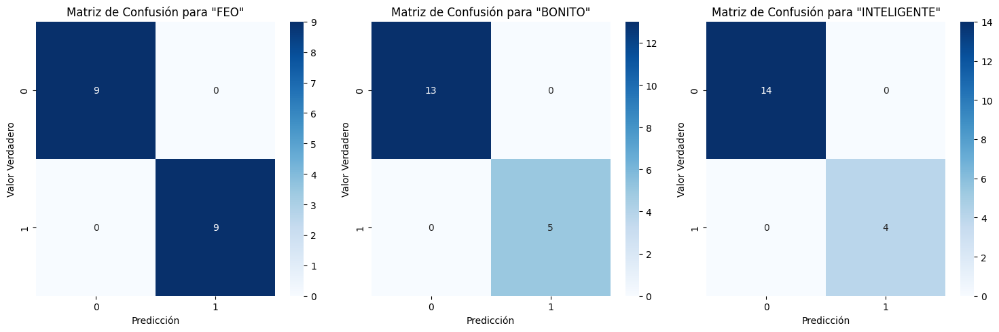

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import multilabel_confusion_matrix
mcm = multilabel_confusion_matrix(ytrue, yhat)
l = list(set(labels))

ig, axes = plt.subplots(1, len(l), figsize=(15, 5))

for i, (ax, matrix) in enumerate(zip(axes, mcm)):
    sns.heatmap(matrix, annot=True, fmt="d", ax=ax, cmap="Blues")
    ax.set_title(f'Matriz de Confusión para "{actions[l[i]]}"')
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Valor Verdadero')

plt.tight_layout()
plt.show()

## 3.2 PRE-ENTRENAMIENTO WEBCAM (DATASET 1) - 12 SEÑAS SELECCIONADAS

### *3.2.1 INICIALIZACION DE VARIABLES*

In [3]:
DATA_PATH = os.path.join('MP_Data_Webcam')

Category: Conjunto de señas seleccionadas para el entrenamiento #2

In [4]:
category = {
    'VOCALES': ['A','E','I','O','U'],
    'PRONOMBRES':['TU','YO','EL','ELLA'],
    'DIAS':['LUNES','JUEVES','VIERNES'],
}

In [5]:
DATA_PATH = os.path.join('MP_Data_Webcam')
no_videos = 30
no_frames = 30

In [6]:
actions = np.array([value for values in category.values() for value in values])

In [7]:
label_map = {label:num for num, label in enumerate(actions)}

### *3.2.2 CARGAR LOS ARRAYS DE LAS SEÑAS SELECCIONADAS*

In [8]:
sequences, labels = [],[]
for action in actions:
    for sequence in range(no_videos):
        window = []
        for frame_num in range(no_frames):
            res = np.load(os.path.join(DATA_PATH,action,str(sequence),"{}.npy".format(frame_num)))
            print(os.path.join(DATA_PATH,action,str(sequence),"{}.npy".format(frame_num)))
            window.append(res)
        sequences.append(window)
        labels.append(label_map[action])

MP_Data_Webcam\A\0\0.npy
MP_Data_Webcam\A\0\1.npy
MP_Data_Webcam\A\0\2.npy
MP_Data_Webcam\A\0\3.npy
MP_Data_Webcam\A\0\4.npy
MP_Data_Webcam\A\0\5.npy
MP_Data_Webcam\A\0\6.npy
MP_Data_Webcam\A\0\7.npy
MP_Data_Webcam\A\0\8.npy
MP_Data_Webcam\A\0\9.npy
MP_Data_Webcam\A\0\10.npy
MP_Data_Webcam\A\0\11.npy
MP_Data_Webcam\A\0\12.npy
MP_Data_Webcam\A\0\13.npy
MP_Data_Webcam\A\0\14.npy
MP_Data_Webcam\A\0\15.npy
MP_Data_Webcam\A\0\16.npy
MP_Data_Webcam\A\0\17.npy
MP_Data_Webcam\A\0\18.npy
MP_Data_Webcam\A\0\19.npy
MP_Data_Webcam\A\0\20.npy
MP_Data_Webcam\A\0\21.npy
MP_Data_Webcam\A\0\22.npy
MP_Data_Webcam\A\0\23.npy
MP_Data_Webcam\A\0\24.npy
MP_Data_Webcam\A\0\25.npy
MP_Data_Webcam\A\0\26.npy
MP_Data_Webcam\A\0\27.npy
MP_Data_Webcam\A\0\28.npy
MP_Data_Webcam\A\0\29.npy
MP_Data_Webcam\A\1\0.npy
MP_Data_Webcam\A\1\1.npy
MP_Data_Webcam\A\1\2.npy
MP_Data_Webcam\A\1\3.npy
MP_Data_Webcam\A\1\4.npy
MP_Data_Webcam\A\1\5.npy
MP_Data_Webcam\A\1\6.npy
MP_Data_Webcam\A\1\7.npy
MP_Data_Webcam\A\1\8.npy
MP_Da

In [9]:
X = np.array(sequences)

In [10]:
y = to_categorical(labels).astype(int)

In [11]:
np.argmax(y, axis=1)

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  2,  2,  2,  2,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,
        3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,
        3,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,
        4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  5,  5,  5,
        5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
        5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  6,  6,  6,  6,  6,  6,  6,
        6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
        6,  6,  6,  6,  6,  6,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,
        7,  7,  7,  7,  7

### *3.2.3 PROCESAMIENTO DE DATOS PARA ENTRENAMIENTO Y EVALUACION*

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.20)

### *3.2.4 CREACION DE UN CALLBACK DE TENSORBOARD PARA VISUALIZAR LAS METRICAS DE ENTRENAMIENTO*

In [13]:
log_dir = os.path.join('Entrenamientos')

In [14]:
os.makedirs(log_dir)

FileExistsError: [WinError 183] No se puede crear un archivo que ya existe: 'Entrenamientos'

### *3.2.5 MODELO DE RED NEURONAL UTILIZADA*

In [17]:
def cargar_modelo():
    model = None
    model = Sequential()
    model.add(LSTM(64,return_sequences=True,activation='relu',input_shape=(30,1662)))
    model.add(LSTM(128,return_sequences=True,activation='relu'))
    model.add(LSTM(64,return_sequences=False,activation='relu'))
    model.add(Dense(64,activation='relu'))
    model.add(Dense(32,activation='relu'))
    model.add(Dense(actions.shape[0],activation='softmax'))
    return model

### *3.2.6 CONFIGURACION Y PROCESO DE ENTRENAMIENTOS*

a. Entrenamiento con 500 épocas

In [18]:
model = None
model = cargar_modelo()

c:\Users\oafo2\Documents\LSTMPrototype\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [19]:
model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['categorical_accuracy'])

In [20]:
log_dir = 'Entrenamientos/train4'
os.makedirs(log_dir)
tb_callback = TensorBoard(log_dir=log_dir)

FileExistsError: [WinError 183] No se puede crear un archivo que ya existe: 'Entrenamientos/train4'

In [22]:
model.fit(X_train,y_train,epochs=500,callbacks=[tb_callback])

Epoch 1/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - categorical_accuracy: 0.1150 - loss: 15.6561
Epoch 2/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - categorical_accuracy: 0.0600 - loss: 21.2762
Epoch 3/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - categorical_accuracy: 0.1194 - loss: 5.0480
Epoch 4/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - categorical_accuracy: 0.0807 - loss: 2.9652
Epoch 5/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - categorical_accuracy: 0.0730 - loss: 2.6321
Epoch 6/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - categorical_accuracy: 0.0538 - loss: 2.5056
Epoch 7/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - categorical_accuracy: 0.0637 - loss: 2.4879
Epoch 8/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - categorical_accuracy: 0.0779 - loss: 2.4828
Epoch 9/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - categorical_accuracy: 0.0903 - loss: 2.4819
Epoch 10/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - categorical_accuracy: 0.1187 - loss: 2.4834
Epoch 11/500
9/9 ━━━━━━━━━━━━━━━━━━━━

In [23]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 30, 64)         │       442,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 30, 128)        │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 12)             │           396 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,790,918 (6.83 MB)

 Trainable params: 596,972 (2.28 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,193,946 (4.55 MB)

In [24]:
res = model.predict(X_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 239ms/step


In [25]:
loss, accuracy = model.evaluate(X_train, y_train)

9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - categorical_accuracy: 0.5754 - loss: 0.8929


In [26]:
loss, accuracy = model.evaluate(X_test, y_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - categorical_accuracy: 0.3446 - loss: 2.4753


In [27]:
model.save('models/train4.h5')

In [95]:
yhat = model.predict(X_test)

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 171ms/step


In [96]:
ytrue = np.argmax(y_test,axis=1).tolist()
yhat = np.argmax(yhat,axis=1).tolist()

In [ ]:
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import multilabel_confusion_matrix

mcm = multilabel_confusion_matrix(ytrue, yhat)

l = list(set(labels))
num_clases = len(l)
cols = 4  # Máximo de columnas por fila
rows = math.ceil(num_clases / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))

# Asegurarse de que `axes` sea siempre una matriz 2D
axes = np.array(axes).reshape(rows, cols)

for idx, matrix in enumerate(mcm):
    r, c = divmod(idx, cols)
    ax = axes[r, c]
    sns.heatmap(matrix, annot=True, fmt="d", ax=ax, cmap="Blues")
    ax.set_title(f'Matriz de Confusión para "{actions[l[idx]]}"')
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Valor Verdadero')

# Oculta ejes vacíos si hay menos clases que subplots
for idx in range(num_clases, rows * cols):
    r, c = divmod(idx, cols)
    fig.delaxes(axes[r, c])

plt.tight_layout()
plt.show()

b. Entrenamiento con 1000 épocas

In [21]:
model = None
model = cargar_modelo()

In [22]:
model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['categorical_accuracy'])

In [23]:
log_dir = 'Entrenamientos/train5'
tb_callback = TensorBoard(log_dir=log_dir)

In [ ]:
os.makedirs(log_dir)

In [24]:
model.fit(X_train,y_train,epochs=1000,callbacks=[tb_callback])

Epoch 1/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - categorical_accuracy: 0.0799 - loss: 2.4874
Epoch 2/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - categorical_accuracy: 0.0862 - loss: 2.4884
Epoch 3/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - categorical_accuracy: 0.1136 - loss: 2.4847
Epoch 4/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - categorical_accuracy: 0.1065 - loss: 2.4852
Epoch 5/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - categorical_accuracy: 0.1015 - loss: 2.4841
Epoch 6/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - categorical_accuracy: 0.0610 - loss: 2.4839
Epoch 7/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - categorical_accuracy: 0.1215 - loss: 2.4825
Epoch 8/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - categorical_accuracy: 0.0979 - loss: 2.4823
Epoch 9/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - categorical_accuracy: 0.1037 - loss: 2.4816
Epoch 10/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - categorical_accuracy: 0.1054 - loss: 2.4818
Epoch 11/1000
9/9 ━━━━━━━━━━━

In [22]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 30, 64)         │       442,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 30, 128)        │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 12)             │           396 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,790,918 (6.83 MB)

 Trainable params: 596,972 (2.28 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,193,946 (4.55 MB)

In [25]:
res = model.predict(X_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 340ms/step


In [26]:
loss, accuracy = model.evaluate(X_train, y_train)

9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - categorical_accuracy: 0.1058 - loss: 2.4850


In [27]:
loss, accuracy = model.evaluate(X_test, y_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - categorical_accuracy: 0.0109 - loss: 2.5426     


In [28]:
model.save('models/train5.h5')

In [35]:
yhat = model.predict(X_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


In [36]:
ytrue = np.argmax(y_test,axis=1).tolist()
yhat = np.argmax(yhat,axis=1).tolist()

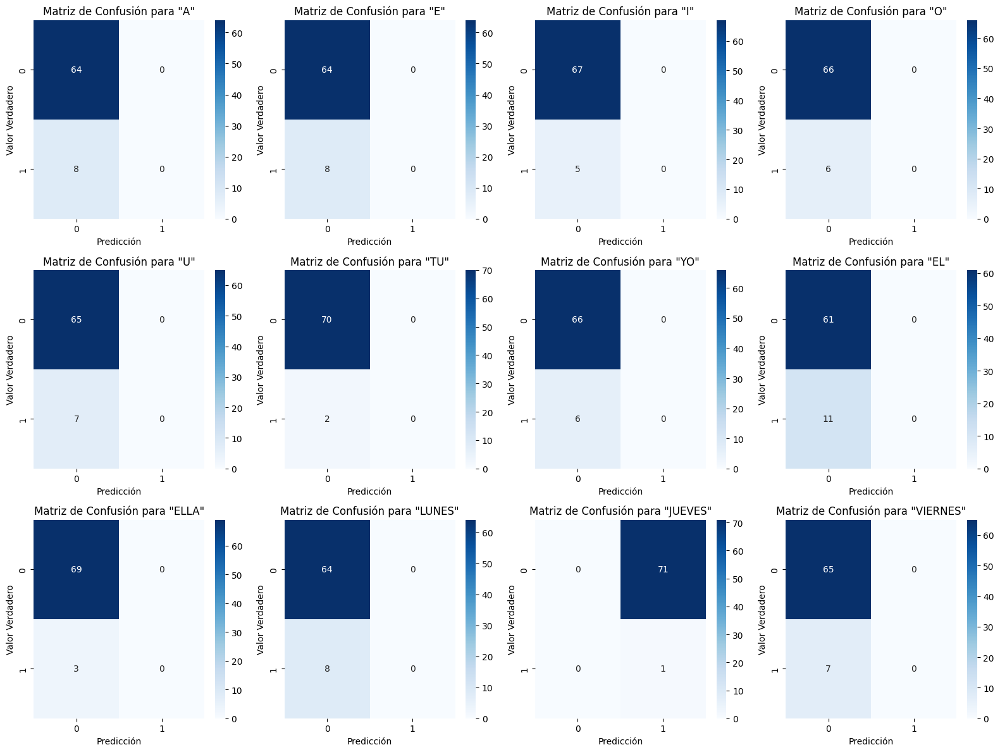

In [37]:
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import multilabel_confusion_matrix

mcm = multilabel_confusion_matrix(ytrue, yhat)

l = list(set(labels))
num_clases = len(l)
cols = 4  # Máximo de columnas por fila
rows = math.ceil(num_clases / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))

# Asegurarse de que `axes` sea siempre una matriz 2D
axes = np.array(axes).reshape(rows, cols)

for idx, matrix in enumerate(mcm):
    r, c = divmod(idx, cols)
    ax = axes[r, c]
    sns.heatmap(matrix, annot=True, fmt="d", ax=ax, cmap="Blues")
    ax.set_title(f'Matriz de Confusión para "{actions[l[idx]]}"')
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Valor Verdadero')

# Oculta ejes vacíos si hay menos clases que subplots
for idx in range(num_clases, rows * cols):
    r, c = divmod(idx, cols)
    fig.delaxes(axes[r, c])

plt.tight_layout()
plt.show()

c. Entrenamiento con 2000 épocas

In [17]:
model = None
model = cargar_modelo()

c:\Users\oafo2\Documents\LSTMPrototype\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [18]:
model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['categorical_accuracy'])

In [19]:
log_dir = 'Entrenamientos/train6'
tb_callback = TensorBoard(log_dir=log_dir)

In [41]:
os.makedirs(log_dir)

In [20]:
model.fit(X_train,y_train,epochs=2000,callbacks=[tb_callback])

Epoch 1/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - categorical_accuracy: 0.0459 - loss: 3.5269
Epoch 2/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - categorical_accuracy: 0.0694 - loss: 2.5172
Epoch 3/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - categorical_accuracy: 0.1164 - loss: 2.4784
Epoch 4/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - categorical_accuracy: 0.0907 - loss: 2.4817
Epoch 5/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - categorical_accuracy: 0.0960 - loss: 2.4594
Epoch 6/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - categorical_accuracy: 0.1053 - loss: 2.4386
Epoch 7/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - categorical_accuracy: 0.1203 - loss: 2.4632
Epoch 8/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - categorical_accuracy: 0.0970 - loss: 2.4212
Epoch 9/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - categorical_accuracy: 0.0919 - loss: 2.4273
Epoch 10/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - categorical_accuracy: 0.1354 - loss: 2.3900
Epoch 11/2000
9/9 ━━━━━━━━━━━

In [21]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 30, 64)         │       442,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 30, 128)        │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 12)             │           396 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,790,918 (6.83 MB)

 Trainable params: 596,972 (2.28 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,193,946 (4.55 MB)

In [44]:
res = model.predict(X_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 296ms/step


In [45]:
loss, accuracy = model.evaluate(X_train, y_train)

9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - categorical_accuracy: 0.1058 - loss: 2.4849


In [46]:
loss, accuracy = model.evaluate(X_test, y_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - categorical_accuracy: 0.0109 - loss: 2.5433    


In [47]:
model.save('models/train6.h5')

In [50]:
yhat = model.predict(X_test)
ytrue = np.argmax(y_test,axis=1).tolist()
yhat = np.argmax(yhat,axis=1).tolist()

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


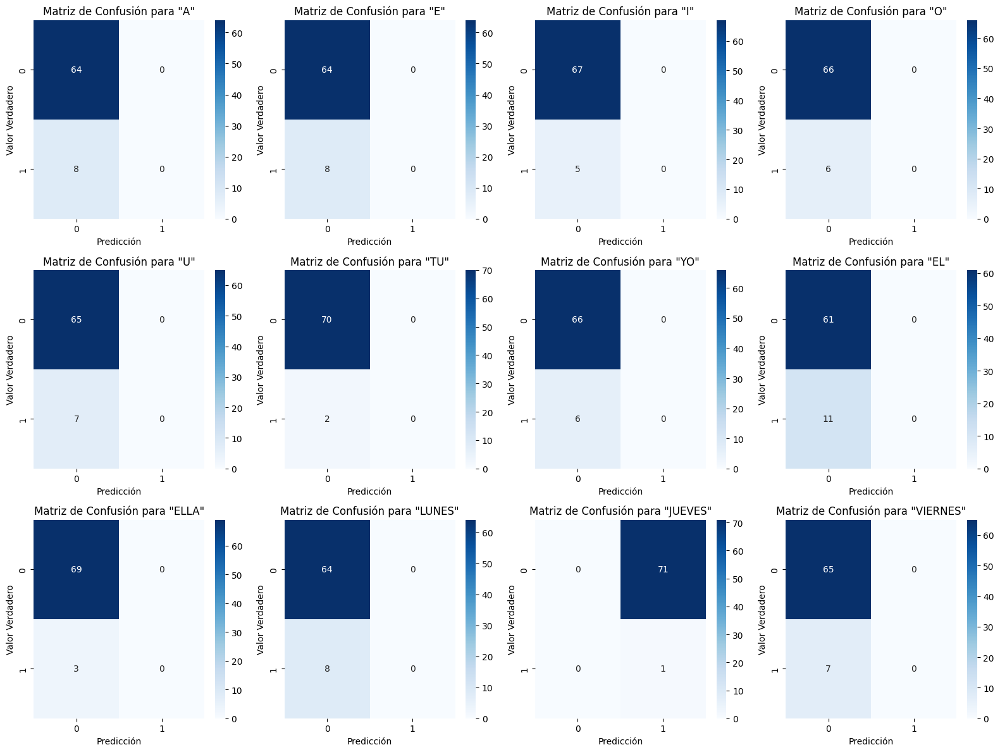

In [51]:
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import multilabel_confusion_matrix

mcm = multilabel_confusion_matrix(ytrue, yhat)

l = list(set(labels))
num_clases = len(l)
cols = 4  # Máximo de columnas por fila
rows = math.ceil(num_clases / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))

# Asegurarse de que `axes` sea siempre una matriz 2D
axes = np.array(axes).reshape(rows, cols)

for idx, matrix in enumerate(mcm):
    r, c = divmod(idx, cols)
    ax = axes[r, c]
    sns.heatmap(matrix, annot=True, fmt="d", ax=ax, cmap="Blues")
    ax.set_title(f'Matriz de Confusión para "{actions[l[idx]]}"')
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Valor Verdadero')

# Oculta ejes vacíos si hay menos clases que subplots
for idx in range(num_clases, rows * cols):
    r, c = divmod(idx, cols)
    fig.delaxes(axes[r, c])

plt.tight_layout()
plt.show()

### *3.2.7 MODELO "2" DE RED NEUORONAL UTILIZADA*

In [15]:
def cargar_modelo():
    model = None
    model = Sequential()
    model.add(LSTM(64,return_sequences=True,input_shape=(30,1662)))
    model.add(LSTM(128,return_sequences=True))
    model.add(LSTM(64,return_sequences=False))
    model.add(Dense(128,activation='relu'))
    model.add(Dense(64,activation='relu'))
    model.add(Dense(actions.shape[0],activation='softmax'))
    return model

### *3.2.8 CONFIGURACION Y PROCESO DE ENTRENAMIENTOS*

a. Entrenamiento con 500 épocas

In [16]:
model = None
model = cargar_modelo()

c:\Users\oafo2\Documents\LSTMPrototype\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [17]:
model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['categorical_accuracy'])

In [18]:
log_dir = 'Entrenamientos/train7'

In [19]:
os.makedirs(log_dir)

In [20]:
tb_callback = TensorBoard(log_dir=log_dir)

In [21]:
model.fit(X_train,y_train,epochs=500,callbacks=[tb_callback])

Epoch 1/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - categorical_accuracy: 0.0489 - loss: 2.5152
Epoch 2/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - categorical_accuracy: 0.0659 - loss: 2.4889
Epoch 3/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - categorical_accuracy: 0.0487 - loss: 2.4925
Epoch 4/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - categorical_accuracy: 0.1007 - loss: 2.4833
Epoch 5/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - categorical_accuracy: 0.1066 - loss: 2.4791
Epoch 6/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - categorical_accuracy: 0.1041 - loss: 2.4796
Epoch 7/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - categorical_accuracy: 0.0942 - loss: 2.4787
Epoch 8/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - categorical_accuracy: 0.1332 - loss: 2.4793
Epoch 9/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - categorical_accuracy: 0.1179 - loss: 2.4683
Epoch 10/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - categorical_accuracy: 0.1105 - loss: 2.4445
Epoch 11/500
9/9 ━━━━━━━━━━━━━━━━━━━━ 0

In [22]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_3 (LSTM)                   │ (None, 30, 64)         │       442,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_4 (LSTM)                   │ (None, 30, 128)        │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_5 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 12)             │           780 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,823,078 (6.95 MB)

 Trainable params: 607,692 (2.32 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,215,386 (4.64 MB)

In [23]:
res = model.predict(X_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 480ms/step


In [24]:
loss, accuracy = model.evaluate(X_train, y_train)

9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - categorical_accuracy: 1.0000 - loss: 2.1756e-04


In [25]:
loss, accuracy = model.evaluate(X_test, y_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - categorical_accuracy: 0.9115 - loss: 0.6656


In [26]:
model.save('models/train7.h5')

In [32]:
yhat = model.predict(X_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


In [33]:
ytrue = np.argmax(y_test,axis=1).tolist()
yhat = np.argmax(yhat,axis=1).tolist()

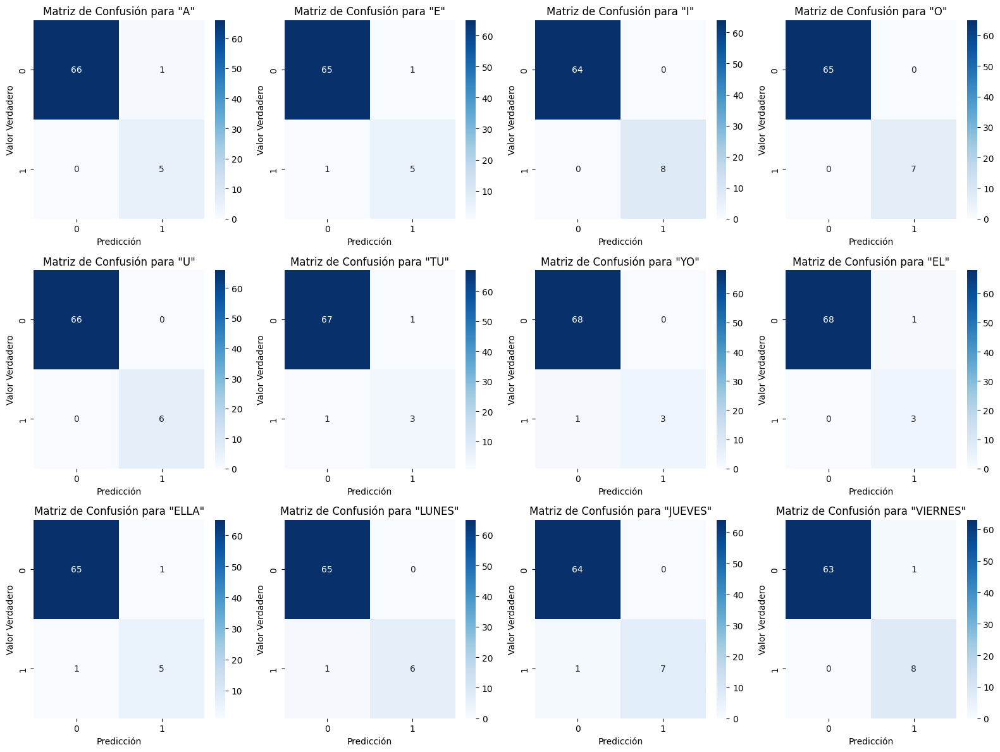

In [34]:
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import multilabel_confusion_matrix

mcm = multilabel_confusion_matrix(ytrue, yhat)

l = list(set(labels))
num_clases = len(l)
cols = 4  # Máximo de columnas por fila
rows = math.ceil(num_clases / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))

# Asegurarse de que `axes` sea siempre una matriz 2D
axes = np.array(axes).reshape(rows, cols)

for idx, matrix in enumerate(mcm):
    r, c = divmod(idx, cols)
    ax = axes[r, c]
    sns.heatmap(matrix, annot=True, fmt="d", ax=ax, cmap="Blues")
    ax.set_title(f'Matriz de Confusión para "{actions[l[idx]]}"')
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Valor Verdadero')

# Oculta ejes vacíos si hay menos clases que subplots
for idx in range(num_clases, rows * cols):
    r, c = divmod(idx, cols)
    fig.delaxes(axes[r, c])

plt.tight_layout()
plt.show()

b. Entrenamiento con 1000 épocas

In [18]:
model = None
model = cargar_modelo()

In [19]:
model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['categorical_accuracy'])

In [20]:
log_dir = 'Entrenamientos/train8'
os.makedirs(log_dir)
tb_callback = TensorBoard(log_dir=log_dir)

In [21]:
model.fit(X_train,y_train,epochs=1000,callbacks=[tb_callback])

Epoch 1/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - categorical_accuracy: 0.0589 - loss: 2.4974
Epoch 2/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - categorical_accuracy: 0.0801 - loss: 2.4932
Epoch 3/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - categorical_accuracy: 0.0880 - loss: 2.4850
Epoch 4/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - categorical_accuracy: 0.1070 - loss: 2.4796
Epoch 5/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - categorical_accuracy: 0.0944 - loss: 2.4902
Epoch 6/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - categorical_accuracy: 0.1219 - loss: 2.4777
Epoch 7/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - categorical_accuracy: 0.0869 - loss: 2.4846
Epoch 8/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - categorical_accuracy: 0.1114 - loss: 2.4783
Epoch 9/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - categorical_accuracy: 0.0832 - loss: 2.4846
Epoch 10/1000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - categorical_accuracy: 0.0685 - loss: 2.4787
Epoch 11/1000
9/9 ━━━━━━━━━━━

In [22]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_3 (LSTM)                   │ (None, 30, 64)         │       442,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_4 (LSTM)                   │ (None, 30, 128)        │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_5 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 12)             │           780 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,823,078 (6.95 MB)

 Trainable params: 607,692 (2.32 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,215,386 (4.64 MB)

In [23]:
res = model.predict(X_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 330ms/step


In [24]:
loss, accuracy = model.evaluate(X_train, y_train)

9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - categorical_accuracy: 1.0000 - loss: 2.8941e-06


In [25]:
loss, accuracy = model.evaluate(X_test, y_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - categorical_accuracy: 0.9813 - loss: 0.2181


In [26]:
model.save('models/train8.h5')

In [30]:
yhat = model.predict(X_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


In [31]:
ytrue = np.argmax(y_test,axis=1).tolist()
yhat = np.argmax(yhat,axis=1).tolist()

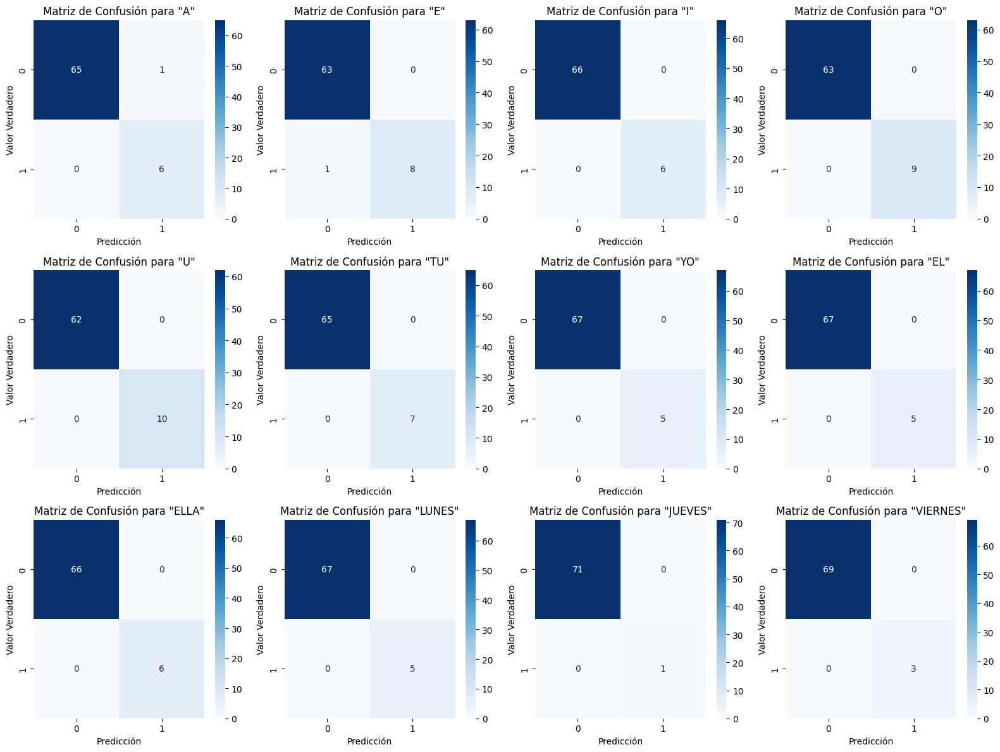

In [32]:
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import multilabel_confusion_matrix

mcm = multilabel_confusion_matrix(ytrue, yhat)

l = list(set(labels))
num_clases = len(l)
cols = 4  # Máximo de columnas por fila
rows = math.ceil(num_clases / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))

# Asegurarse de que `axes` sea siempre una matriz 2D
axes = np.array(axes).reshape(rows, cols)

for idx, matrix in enumerate(mcm):
    r, c = divmod(idx, cols)
    ax = axes[r, c]
    sns.heatmap(matrix, annot=True, fmt="d", ax=ax, cmap="Blues")
    ax.set_title(f'Matriz de Confusión para "{actions[l[idx]]}"')
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Valor Verdadero')

# Oculta ejes vacíos si hay menos clases que subplots
for idx in range(num_clases, rows * cols):
    r, c = divmod(idx, cols)
    fig.delaxes(axes[r, c])

plt.tight_layout()
plt.show()

c. Entrenamiento con 2000 épocas.

In [38]:
model = None
model = cargar_modelo()

c:\Users\oafo2\Documents\LSTMPrototype\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [39]:
model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['categorical_accuracy'])

In [42]:
log_dir = 'Entrenamientos/train9'
os.makedirs(log_dir)
tb_callback = TensorBoard(log_dir=log_dir)

In [43]:
model.fit(X_train,y_train,epochs=2000,callbacks=[tb_callback])

Epoch 1/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - categorical_accuracy: 0.0750 - loss: 2.5048
Epoch 2/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - categorical_accuracy: 0.0724 - loss: 2.4920
Epoch 3/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - categorical_accuracy: 0.1027 - loss: 2.4830
Epoch 4/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - categorical_accuracy: 0.1048 - loss: 2.4880
Epoch 5/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - categorical_accuracy: 0.0812 - loss: 2.4787
Epoch 6/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - categorical_accuracy: 0.0860 - loss: 2.4811
Epoch 7/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - categorical_accuracy: 0.0921 - loss: 2.4700
Epoch 8/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - categorical_accuracy: 0.0827 - loss: 2.4814
Epoch 9/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - categorical_accuracy: 0.0936 - loss: 2.4755
Epoch 10/2000
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - categorical_accuracy: 0.0852 - loss: 2.4694
Epoch 11/2000
9/9 ━━━━━━━━━━━

In [44]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_6 (LSTM)                   │ (None, 30, 64)         │       442,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_7 (LSTM)                   │ (None, 30, 128)        │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_8 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 12)             │           780 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,823,078 (6.95 MB)

 Trainable params: 607,692 (2.32 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,215,386 (4.64 MB)

In [45]:
res = model.predict(X_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 258ms/step


In [46]:
loss, accuracy = model.evaluate(X_train, y_train)

9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - categorical_accuracy: 1.0000 - loss: 3.4509e-07


In [47]:
loss, accuracy = model.evaluate(X_test, y_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - categorical_accuracy: 0.9332 - loss: 0.8753 


In [48]:
model.save('models/train9.h5')

In [53]:
yhat = model.predict(X_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


In [54]:
ytrue = np.argmax(y_test,axis=1).tolist()
yhat = np.argmax(yhat,axis=1).tolist()

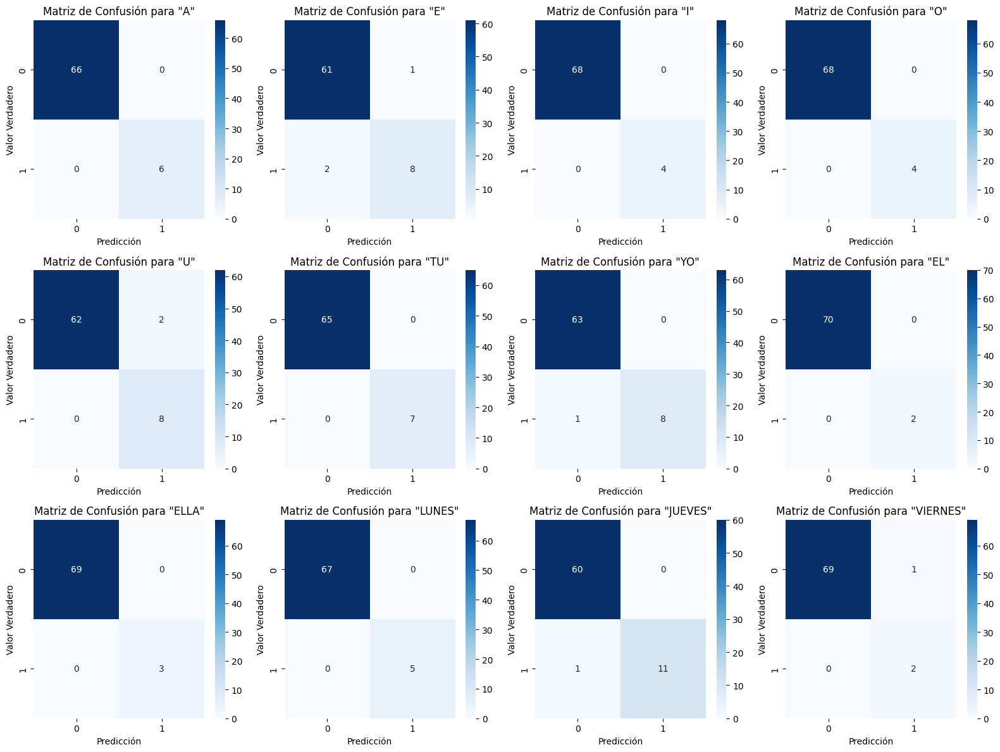

In [55]:
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import multilabel_confusion_matrix

mcm = multilabel_confusion_matrix(ytrue, yhat)

l = list(set(labels))
num_clases = len(l)
cols = 4  # Máximo de columnas por fila
rows = math.ceil(num_clases / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))

# Asegurarse de que `axes` sea siempre una matriz 2D
axes = np.array(axes).reshape(rows, cols)

for idx, matrix in enumerate(mcm):
    r, c = divmod(idx, cols)
    ax = axes[r, c]
    sns.heatmap(matrix, annot=True, fmt="d", ax=ax, cmap="Blues")
    ax.set_title(f'Matriz de Confusión para "{actions[l[idx]]}"')
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Valor Verdadero')

# Oculta ejes vacíos si hay menos clases que subplots
for idx in range(num_clases, rows * cols):
    r, c = divmod(idx, cols)
    fig.delaxes(axes[r, c])

plt.tight_layout()
plt.show()

## 3.3 PRE-ENTRENAMIENTO WEBCAM (DATASET 1) - 25 SEÑAS SELECCIONADAS

### *3.3.1 INICIALIZACION DE VARIABLES*

In [33]:
DATA_PATH = os.path.join('MP_Data_Webcam')

In [34]:
category = {
    'VOCALES': ['A','E','I','O','U'],
    'PRONOMBRES':['TU','YO','EL','ELLA'],
    'DIAS':['LUNES','JUEVES','VIERNES'],
    'ADJETIVOS':['FEO','BONITO','INTELIGENTE'],
    'PERSONAS':['PAPA','MAMA','HOMBRE','MUJER','SENOR'],
    'PROVINCIAS':['PANAMA','BOCAS DEL TORO','VERAGUAS'],
    'PROFESIONES':['INGENIERO','POLICIA'],
}

In [35]:
DATA_PATH = os.path.join('MP_Data_Webcam')
no_videos = 30
no_frames = 30

In [36]:
actions = np.array([value for values in category.values() for value in values])

In [37]:
label_map = {label:num for num, label in enumerate(actions)}

### *3.3.2 CARGAR LOS ARRAYS DE LAS SEÑAS SELECCIONADAS*

In [38]:
sequences, labels = [],[]
for action in actions:
    for sequence in range(no_videos):
        window = []
        for frame_num in range(no_frames):
            res = np.load(os.path.join(DATA_PATH,action,str(sequence),"{}.npy".format(frame_num)))
            print(os.path.join(DATA_PATH,action,str(sequence),"{}.npy".format(frame_num)))
            window.append(res)
        sequences.append(window)
        labels.append(label_map[action])

MP_Data_Webcam\A\0\0.npy
MP_Data_Webcam\A\0\1.npy
MP_Data_Webcam\A\0\2.npy
MP_Data_Webcam\A\0\3.npy
MP_Data_Webcam\A\0\4.npy
MP_Data_Webcam\A\0\5.npy
MP_Data_Webcam\A\0\6.npy
MP_Data_Webcam\A\0\7.npy
MP_Data_Webcam\A\0\8.npy
MP_Data_Webcam\A\0\9.npy
MP_Data_Webcam\A\0\10.npy
MP_Data_Webcam\A\0\11.npy
MP_Data_Webcam\A\0\12.npy
MP_Data_Webcam\A\0\13.npy
MP_Data_Webcam\A\0\14.npy
MP_Data_Webcam\A\0\15.npy
MP_Data_Webcam\A\0\16.npy
MP_Data_Webcam\A\0\17.npy
MP_Data_Webcam\A\0\18.npy
MP_Data_Webcam\A\0\19.npy
MP_Data_Webcam\A\0\20.npy
MP_Data_Webcam\A\0\21.npy
MP_Data_Webcam\A\0\22.npy
MP_Data_Webcam\A\0\23.npy
MP_Data_Webcam\A\0\24.npy
MP_Data_Webcam\A\0\25.npy
MP_Data_Webcam\A\0\26.npy
MP_Data_Webcam\A\0\27.npy
MP_Data_Webcam\A\0\28.npy
MP_Data_Webcam\A\0\29.npy
MP_Data_Webcam\A\1\0.npy
MP_Data_Webcam\A\1\1.npy
MP_Data_Webcam\A\1\2.npy
MP_Data_Webcam\A\1\3.npy
MP_Data_Webcam\A\1\4.npy
MP_Data_Webcam\A\1\5.npy
MP_Data_Webcam\A\1\6.npy
MP_Data_Webcam\A\1\7.npy
MP_Data_Webcam\A\1\8.npy
MP_Da

In [39]:
X = np.array(sequences)

In [40]:
y = to_categorical(labels).astype(int)

In [41]:
np.argmax(y, axis=1)

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  2,  2,  2,  2,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,
        3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,
        3,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,
        4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  5,  5,  5,
        5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
        5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  6,  6,  6,  6,  6,  6,  6,
        6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
        6,  6,  6,  6,  6,  6,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,
        7,  7,  7,  7,  7

### *3.3.3 PROCESAMIENTO PARA DATOS PARA ENTRENAMIENTO Y EVALUACION*

In [42]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.20)

### *3.3.4 CREACION DE UN CALLBACK DE TENSORBOARD PARA VISUALIZAR LAS METRICAS DE ENTRENAMIENTO*

In [43]:
log_dir = os.path.join('Entrenamientos')

In [44]:
os.makedirs(log_dir)

FileExistsError: [WinError 183] No se puede crear un archivo que ya existe: 'Entrenamientos'

### *3.3.5 MODELO DE RED NEURONAL UTILIZADA*

In [79]:
def cargar_modelo():
    model = None
    model = Sequential()
    model.add(LSTM(64,return_sequences=True,input_shape=(30,1662)))
    model.add(LSTM(128,return_sequences=True))
    model.add(LSTM(64,return_sequences=False))
    model.add(Dense(128,activation='relu'))
    model.add(Dense(64,activation='relu'))
    model.add(Dense(actions.shape[0],activation='softmax'))
    return model

### *3.3.6 CONFIGURACION Y PROCESO DE ENTRENAMIENTO*

a. Entrenamiento con 500 épocas

In [46]:
model = None
model = cargar_modelo()

c:\Users\oafo2\Documents\LSTMPrototype\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [47]:
model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['categorical_accuracy'])

In [ ]:
log_dir = 'Entrenamientos/train10'
os.makedirs(log_dir)
tb_callback = TensorBoard(log_dir=log_dir)

In [51]:
model.fit(X_train,y_train,epochs=500,callbacks=[tb_callback])

Epoch 1/500
19/19 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - categorical_accuracy: 0.0243 - loss: 3.6610
Epoch 2/500
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - categorical_accuracy: 0.0394 - loss: 3.2136
Epoch 3/500
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - categorical_accuracy: 0.0622 - loss: 3.1962
Epoch 4/500
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - categorical_accuracy: 0.0788 - loss: 3.2168
Epoch 5/500
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - categorical_accuracy: 0.0522 - loss: 3.2282
Epoch 6/500
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - categorical_accuracy: 0.0573 - loss: 3.2033
Epoch 7/500
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - categorical_accuracy: 0.0545 - loss: 3.5130
Epoch 8/500
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - categorical_accuracy: 0.0437 - loss: 3.2110
Epoch 9/500
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - categorical_accuracy: 0.0410 - loss: 3.2119
Epoch 10/500
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - categorical_accuracy: 0.0475 - loss: 3.2079
Epoch 11/500
19/19 

In [52]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_6 (LSTM)                   │ (None, 30, 64)         │       442,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_7 (LSTM)                   │ (None, 30, 128)        │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_8 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 25)             │         1,625 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,825,613 (6.96 MB)

 Trainable params: 608,537 (2.32 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,217,076 (4.64 MB)

In [56]:
res = model.predict(X_train)

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


In [57]:
loss, accuracy = model.evaluate(X_train, y_train)

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - categorical_accuracy: 0.9839 - loss: 0.0710


In [61]:
loss, accuracy = model.evaluate(X_test, y_test)

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - categorical_accuracy: 0.8751 - loss: 1.1873


In [62]:
model.save('models/train10.h5')

In [65]:
yhat = model.predict(X_test)
ytrue = np.argmax(y_test,axis=1).tolist()
yhat = np.argmax(yhat,axis=1).tolist()

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


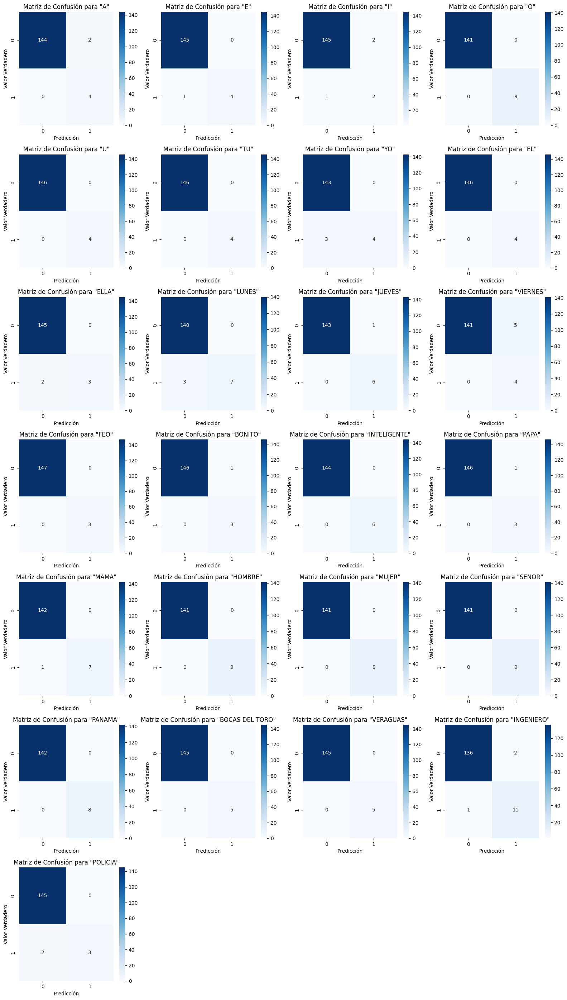

In [66]:
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import multilabel_confusion_matrix

mcm = multilabel_confusion_matrix(ytrue, yhat)

l = list(set(labels))
num_clases = len(l)
cols = 4  # Máximo de columnas por fila
rows = math.ceil(num_clases / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))

# Asegurarse de que `axes` sea siempre una matriz 2D
axes = np.array(axes).reshape(rows, cols)

for idx, matrix in enumerate(mcm):
    r, c = divmod(idx, cols)
    ax = axes[r, c]
    sns.heatmap(matrix, annot=True, fmt="d", ax=ax, cmap="Blues")
    ax.set_title(f'Matriz de Confusión para "{actions[l[idx]]}"')
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Valor Verdadero')

# Oculta ejes vacíos si hay menos clases que subplots
for idx in range(num_clases, rows * cols):
    r, c = divmod(idx, cols)
    fig.delaxes(axes[r, c])

plt.tight_layout()
plt.show()

b. Entrenamiento con 1000 épocas

In [80]:
model = None
model = cargar_modelo()

In [81]:
model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['categorical_accuracy'])

In [ ]:
log_dir = 'Entrenamientos/train11'
os.makedirs(log_dir)
tb_callback = TensorBoard(log_dir=log_dir)

In [83]:
model.fit(X_train,y_train,epochs=1000,callbacks=[tb_callback])

Epoch 1/1000
19/19 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - categorical_accuracy: 0.0615 - loss: 3.2271
Epoch 2/1000
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - categorical_accuracy: 0.0426 - loss: 3.2192
Epoch 3/1000
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - categorical_accuracy: 0.0408 - loss: 3.2124
Epoch 4/1000
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - categorical_accuracy: 0.0634 - loss: 3.2025
Epoch 5/1000
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - categorical_accuracy: 0.1042 - loss: 3.0646
Epoch 6/1000
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - categorical_accuracy: 0.1405 - loss: 2.7492
Epoch 7/1000
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - categorical_accuracy: 0.1005 - loss: 2.8700
Epoch 8/1000
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - categorical_accuracy: 0.1516 - loss: 2.6056
Epoch 9/1000
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - categorical_accuracy: 0.1931 - loss: 2.3743
Epoch 10/1000
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - categorical_accuracy: 0.2211 - loss: 2.2171
Epoch 11/

In [84]:
model.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_21 (LSTM)                  │ (None, 30, 64)         │       442,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_22 (LSTM)                  │ (None, 30, 128)        │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_23 (LSTM)                  │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 25)             │         1,625 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,825,613 (6.96 MB)

 Trainable params: 608,537 (2.32 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,217,076 (4.64 MB)

In [85]:
res = model.predict(X_train)

19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step


In [86]:
loss, accuracy = model.evaluate(X_train, y_train)

19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - categorical_accuracy: 1.0000 - loss: 1.1729e-04


In [87]:
loss, accuracy = model.evaluate(X_test, y_test)

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - categorical_accuracy: 0.9847 - loss: 0.0617   


In [88]:
model.save('models/train11.h5')

In [91]:
yhat = model.predict(X_test)
ytrue = np.argmax(y_test,axis=1).tolist()
yhat = np.argmax(yhat,axis=1).tolist()

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


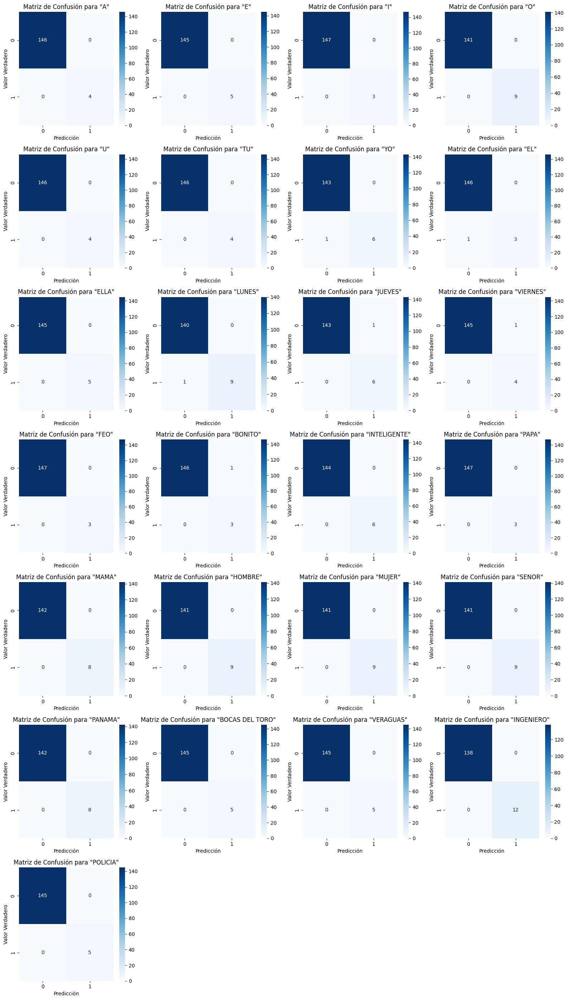

In [92]:
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import multilabel_confusion_matrix

mcm = multilabel_confusion_matrix(ytrue, yhat)

l = list(set(labels))
num_clases = len(l)
cols = 4  # Máximo de columnas por fila
rows = math.ceil(num_clases / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))

# Asegurarse de que `axes` sea siempre una matriz 2D
axes = np.array(axes).reshape(rows, cols)

for idx, matrix in enumerate(mcm):
    r, c = divmod(idx, cols)
    ax = axes[r, c]
    sns.heatmap(matrix, annot=True, fmt="d", ax=ax, cmap="Blues")
    ax.set_title(f'Matriz de Confusión para "{actions[l[idx]]}"')
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Valor Verdadero')

# Oculta ejes vacíos si hay menos clases que subplots
for idx in range(num_clases, rows * cols):
    r, c = divmod(idx, cols)
    fig.delaxes(axes[r, c])

plt.tight_layout()
plt.show()

c. Entrenamiento con 2000 épocas

In [113]:
model = None
model = cargar_modelo()

c:\Users\oafo2\Documents\LSTMPrototype\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [114]:
model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['categorical_accuracy'])

In [115]:
log_dir = 'Entrenamientos/train12'
os.makedirs(log_dir)
tb_callback = TensorBoard(log_dir=log_dir)

In [116]:
model.fit(X_train,y_train,epochs=2000,callbacks=[tb_callback])

Epoch 1/2000
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - categorical_accuracy: 0.0680 - loss: 4.4808
Epoch 2/2000
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - categorical_accuracy: 0.0655 - loss: 3.7383
Epoch 3/2000
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - categorical_accuracy: 0.0573 - loss: 3.0154
Epoch 4/2000
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - categorical_accuracy: 0.0806 - loss: 2.9745
Epoch 5/2000
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - categorical_accuracy: 0.0994 - loss: 2.9757
Epoch 6/2000
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - categorical_accuracy: 0.1119 - loss: 2.9317
Epoch 7/2000
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - categorical_accuracy: 0.1285 - loss: 2.8607
Epoch 8/2000
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - categorical_accuracy: 0.0532 - loss: 2.9565
Epoch 9/2000
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - categorical_accuracy: 0.0657 - loss: 2.9837
Epoch 10/2000
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - categorical_accuracy: 0.0669 - loss: 2.9678
Epoch 11/

In [117]:
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_15 (LSTM)                  │ (None, 30, 64)         │       442,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_16 (LSTM)                  │ (None, 30, 128)        │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_17 (LSTM)                  │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 20)             │           660 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,791,710 (6.83 MB)

 Trainable params: 597,236 (2.28 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,194,474 (4.56 MB)

In [118]:
res = model.predict(X_train)

15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step


In [119]:
loss, accuracy = model.evaluate(X_train, y_train)

15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - categorical_accuracy: 0.0557 - loss: 2.9903


In [120]:
loss, accuracy = model.evaluate(X_test, y_test)

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - categorical_accuracy: 0.0054 - loss: 3.0376    


In [121]:
model.save('models/train12.h5')

In [124]:
yhat = model.predict(X_test)
ytrue = np.argmax(y_test,axis=1).tolist()
yhat = np.argmax(yhat,axis=1).tolist()

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step


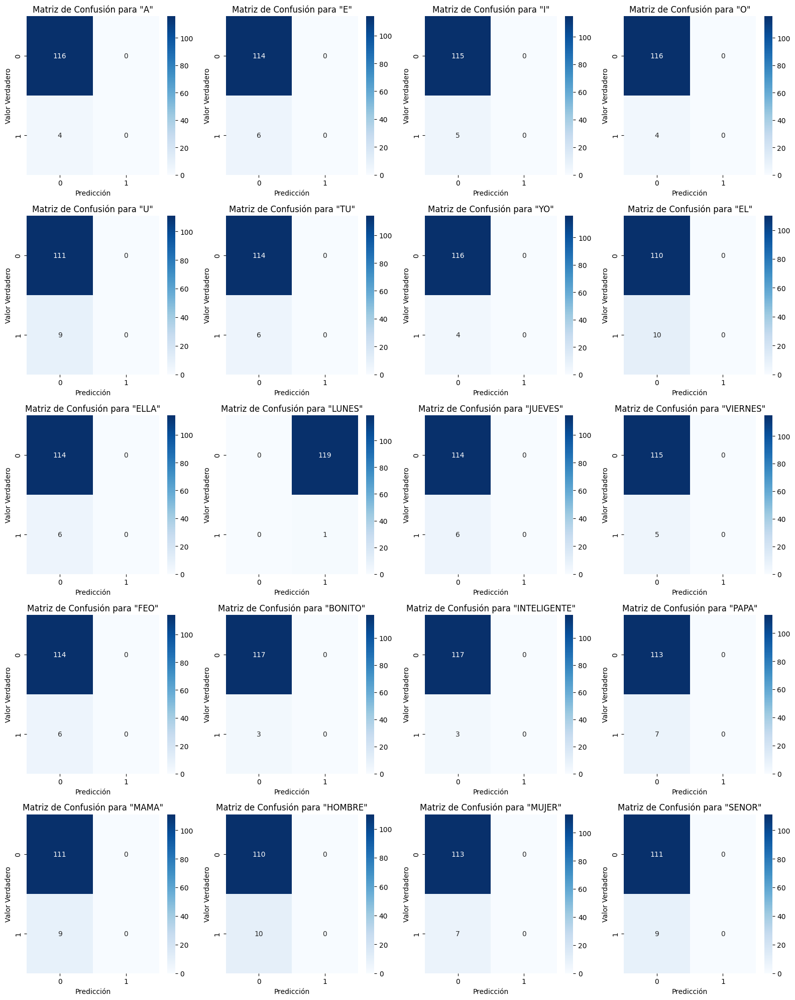

In [125]:
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import multilabel_confusion_matrix

mcm = multilabel_confusion_matrix(ytrue, yhat)

l = list(set(labels))
num_clases = len(l)
cols = 4  # Máximo de columnas por fila
rows = math.ceil(num_clases / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))

# Asegurarse de que `axes` sea siempre una matriz 2D
axes = np.array(axes).reshape(rows, cols)

for idx, matrix in enumerate(mcm):
    r, c = divmod(idx, cols)
    ax = axes[r, c]
    sns.heatmap(matrix, annot=True, fmt="d", ax=ax, cmap="Blues")
    ax.set_title(f'Matriz de Confusión para "{actions[l[idx]]}"')
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Valor Verdadero')

# Oculta ejes vacíos si hay menos clases que subplots
for idx in range(num_clases, rows * cols):
    r, c = divmod(idx, cols)
    fig.delaxes(axes[r, c])

plt.tight_layout()
plt.show()

## 3.4 PRE-ENTRENAMIENTO WEBCAM (DATASET 1) - 49 SEÑAS SELECCIONADAS

### *3.4.1 INICIALIZACION DE VARIABLES*

In [4]:
DATA_PATH = os.path.join('MP_Data_Webcam')

In [5]:
category = {
    'VOCALES': ['A','E','I','O','U'],
    'PRONOMBRES':['TU','YO','EL','ELLA'],
    'DIAS':['LUNES','JUEVES','VIERNES'],
    'ADJETIVOS':['FEO','BONITO','INTELIGENTE'],
    'ALIMENTOS':['HUEVO','JUGO','LECHE','CAFE'],
    'TIEMPO':['MANANA','BUENOS DIAS','BUENAS TARDES','BUENAS NOCHES','AYER','HOY'],
    'VERBOS':['BUSCAR','MENTIR','HABLAR','ESCRIBIR'],
    'COLORES':['ROJO','AMARILLO','VERDE'],
    'PROVINCIAS':['PANAMA','BOCAS DEL TORO','VERAGUAS'],
    'PROFESIONES':['INGENIERO','POLICIA'],
    'TRANSPORTES':['BUS','MOTO','BICICLETA'],
    'ANIMALES':['GALLO','PERRO','TORTUGA','GATO'],
    'PERSONAS':['PAPA','MAMA','HOMBRE','MUJER','SENOR'],
}

In [6]:
DATA_PATH = os.path.join('MP_Data_Webcam')
no_videos = 30
no_frames = 30

In [7]:
actions = np.array([value for values in category.values() for value in values])

In [8]:
label_map = {label:num for num, label in enumerate(actions)}

### *3.4.2 CARGAR LOS ARRAYS DE LAS SEÑAS SELECCIONADAS*

In [9]:
sequences, labels = [],[]
for action in actions:
    for sequence in range(no_videos):
        window = []
        for frame_num in range(no_frames):
            res = np.load(os.path.join(DATA_PATH,action,str(sequence),"{}.npy".format(frame_num)))
            print(os.path.join(DATA_PATH,action,str(sequence),"{}.npy".format(frame_num)))
            window.append(res)
        sequences.append(window)
        labels.append(label_map[action])

MP_Data_Webcam\A\0\0.npy
MP_Data_Webcam\A\0\1.npy
MP_Data_Webcam\A\0\2.npy
MP_Data_Webcam\A\0\3.npy
MP_Data_Webcam\A\0\4.npy
MP_Data_Webcam\A\0\5.npy
MP_Data_Webcam\A\0\6.npy
MP_Data_Webcam\A\0\7.npy
MP_Data_Webcam\A\0\8.npy
MP_Data_Webcam\A\0\9.npy
MP_Data_Webcam\A\0\10.npy
MP_Data_Webcam\A\0\11.npy
MP_Data_Webcam\A\0\12.npy
MP_Data_Webcam\A\0\13.npy
MP_Data_Webcam\A\0\14.npy
MP_Data_Webcam\A\0\15.npy
MP_Data_Webcam\A\0\16.npy
MP_Data_Webcam\A\0\17.npy
MP_Data_Webcam\A\0\18.npy
MP_Data_Webcam\A\0\19.npy
MP_Data_Webcam\A\0\20.npy
MP_Data_Webcam\A\0\21.npy
MP_Data_Webcam\A\0\22.npy
MP_Data_Webcam\A\0\23.npy
MP_Data_Webcam\A\0\24.npy
MP_Data_Webcam\A\0\25.npy
MP_Data_Webcam\A\0\26.npy
MP_Data_Webcam\A\0\27.npy
MP_Data_Webcam\A\0\28.npy
MP_Data_Webcam\A\0\29.npy
MP_Data_Webcam\A\1\0.npy
MP_Data_Webcam\A\1\1.npy
MP_Data_Webcam\A\1\2.npy
MP_Data_Webcam\A\1\3.npy
MP_Data_Webcam\A\1\4.npy
MP_Data_Webcam\A\1\5.npy
MP_Data_Webcam\A\1\6.npy
MP_Data_Webcam\A\1\7.npy
MP_Data_Webcam\A\1\8.npy
MP_Da

In [10]:
X = np.array(sequences)

In [11]:
y = to_categorical(labels).astype(int)

In [12]:
np.argmax(y, axis=1)

array([ 0,  0,  0, ..., 48, 48, 48], dtype=int64)

### *3.4.3 PROCESAMIENTO PARA DATOS PARA ENTRENAMIENTO Y EVALUACION*

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.20)

### *3.4.4 CREACION DE UN CALLBACK DE TENSORBOARD PARA VISUALIZAR LAS METRICAS DE ENTRENAMIENTO*

In [14]:
log_dir = os.path.join('Entrenamientos')

In [15]:
os.makedirs(log_dir)

FileExistsError: [WinError 183] No se puede crear un archivo que ya existe: 'Entrenamientos'

### *3.4.5 MODELO DE RED NEURONAL UTILIZADA*

In [16]:
def cargar_modelo():
    model = None
    model = Sequential()
    model.add(LSTM(64,return_sequences=True,input_shape=(30,1662)))
    model.add(LSTM(128,return_sequences=True))
    model.add(LSTM(64,return_sequences=False))
    model.add(Dense(128,activation='relu'))
    model.add(Dense(64,activation='relu'))
    model.add(Dense(actions.shape[0],activation='softmax'))
    return model

### *3.4.6 CONFIGURACION Y PROCESO DE ENTRENAMIENTO*

a. Entrenamiento con 500 épocas

In [17]:
model = None
model = cargar_modelo()

c:\Users\oafo2\Documents\LSTMPrototype\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [18]:
model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['categorical_accuracy'])

In [20]:
log_dir = 'Entrenamientos/train12'
os.makedirs(log_dir)
tb_callback = TensorBoard(log_dir=log_dir)

In [21]:
model.fit(X_train,y_train,epochs=500,callbacks=[tb_callback])

Epoch 1/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - categorical_accuracy: 0.0244 - loss: 3.8778
Epoch 2/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step - categorical_accuracy: 0.0432 - loss: 3.6627
Epoch 3/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - categorical_accuracy: 0.0329 - loss: 3.5760
Epoch 4/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - categorical_accuracy: 0.0362 - loss: 3.3679
Epoch 5/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - categorical_accuracy: 0.0520 - loss: 3.2640
Epoch 6/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - categorical_accuracy: 0.0590 - loss: 3.0866
Epoch 7/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - categorical_accuracy: 0.0744 - loss: 2.9943
Epoch 8/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - categorical_accuracy: 0.0887 - loss: 2.9374
Epoch 9/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - categorical_accuracy: 0.1011 - loss: 2.7569
Epoch 10/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - categorical_accuracy: 0.1047 - loss: 2.6867
Epoch 11/500
37/37 

In [22]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 30, 64)         │       442,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 30, 128)        │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 49)             │         3,185 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,830,293 (6.98 MB)

 Trainable params: 610,097 (2.33 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,220,196 (4.65 MB)

In [23]:
res = model.predict(X_train)

37/37 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step


In [24]:
loss, accuracy = model.evaluate(X_train, y_train)

37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - categorical_accuracy: 1.0000 - loss: 1.7053e-05


In [25]:
loss, accuracy = model.evaluate(X_test, y_test)

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - categorical_accuracy: 0.9734 - loss: 0.2694


In [27]:
model.save('models/train12.h5')

In [30]:
yhat = model.predict(X_test)
ytrue = np.argmax(y_test,axis=1).tolist()
yhat = np.argmax(yhat,axis=1).tolist()

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


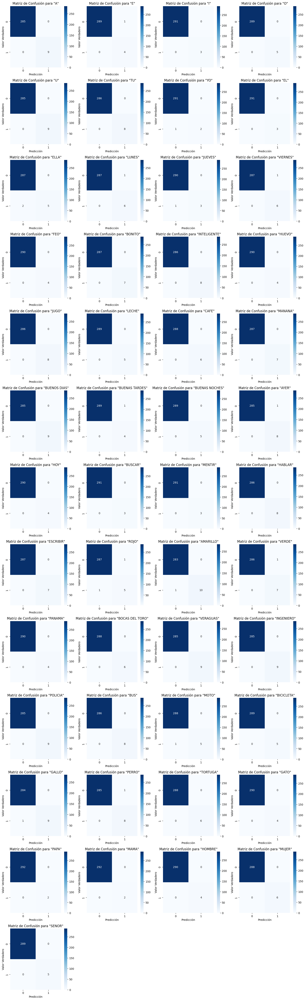

In [31]:
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import multilabel_confusion_matrix

mcm = multilabel_confusion_matrix(ytrue, yhat)

l = list(set(labels))
num_clases = len(l)
cols = 4  # Máximo de columnas por fila
rows = math.ceil(num_clases / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))

# Asegurarse de que `axes` sea siempre una matriz 2D
axes = np.array(axes).reshape(rows, cols)

for idx, matrix in enumerate(mcm):
    r, c = divmod(idx, cols)
    ax = axes[r, c]
    sns.heatmap(matrix, annot=True, fmt="d", ax=ax, cmap="Blues")
    ax.set_title(f'Matriz de Confusión para "{actions[l[idx]]}"')
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Valor Verdadero')

# Oculta ejes vacíos si hay menos clases que subplots
for idx in range(num_clases, rows * cols):
    r, c = divmod(idx, cols)
    fig.delaxes(axes[r, c])

plt.tight_layout()
plt.show()

## 3.5 PRE-ENTRENAMIENTO CELULAR (DATASET 1) - 49 SEÑAS SELECCIONADAS

### *3.5.1 INICIALIZACION DE VARIABLES*

In [4]:
DATA_PATH = os.path.join('MP_Data_Celular')
no_videos = 30
no_frames = 30

In [5]:
category = {
    'VOCALES': ['A','E','I','O','U'],
    'PRONOMBRES':['TU','YO','EL','ELLA'],
    'DIAS':['LUNES','JUEVES','VIERNES'],
    'ADJETIVOS':['FEO','BONITO','INTELIGENTE'],
    'ALIMENTOS':['HUEVO','JUGO','LECHE','CAFE'],
    'TIEMPO':['MANANA','BUENOS DIAS','BUENAS TARDES','BUENAS NOCHES','AYER','HOY'],
    'VERBOS':['BUSCAR','MENTIR','HABLAR','ESCRIBIR'],
    'COLORES':['ROJO','AMARILLO','VERDE'],
    'PROVINCIAS':['PANAMA','BOCAS DEL TORO','VERAGUAS'],
    'PROFESIONES':['INGENIERO','POLICIA'],
    'TRANSPORTES':['BUS','MOTO','BICICLETA'],
    'ANIMALES':['GALLO','PERRO','TORTUGA','GATO'],
    'PERSONAS':['PAPA','MAMA','HOMBRE','MUJER','SENOR'],
}

In [6]:
actions = np.array([value for values in category.values() for value in values])

In [7]:
label_map = {label:num for num, label in enumerate(actions)}

### *3.5.2 CARGAR LOS ARRAYS DE LAS SEÑAS SELECCIONADAS*

In [8]:
sequences, labels = [],[]
for action in actions:
    for sequence in range(no_videos):
        window = []
        for frame_num in range(no_frames):
            res = np.load(os.path.join(DATA_PATH,action,str(sequence),"{}.npy".format(frame_num)))
            print(os.path.join(DATA_PATH,action,str(sequence),"{}.npy".format(frame_num)))
            window.append(res)
        sequences.append(window)
        labels.append(label_map[action])

MP_Data_Celular\A\0\0.npy
MP_Data_Celular\A\0\1.npy
MP_Data_Celular\A\0\2.npy
MP_Data_Celular\A\0\3.npy
MP_Data_Celular\A\0\4.npy
MP_Data_Celular\A\0\5.npy
MP_Data_Celular\A\0\6.npy
MP_Data_Celular\A\0\7.npy
MP_Data_Celular\A\0\8.npy
MP_Data_Celular\A\0\9.npy
MP_Data_Celular\A\0\10.npy
MP_Data_Celular\A\0\11.npy
MP_Data_Celular\A\0\12.npy
MP_Data_Celular\A\0\13.npy
MP_Data_Celular\A\0\14.npy
MP_Data_Celular\A\0\15.npy
MP_Data_Celular\A\0\16.npy
MP_Data_Celular\A\0\17.npy
MP_Data_Celular\A\0\18.npy
MP_Data_Celular\A\0\19.npy
MP_Data_Celular\A\0\20.npy
MP_Data_Celular\A\0\21.npy
MP_Data_Celular\A\0\22.npy
MP_Data_Celular\A\0\23.npy
MP_Data_Celular\A\0\24.npy
MP_Data_Celular\A\0\25.npy
MP_Data_Celular\A\0\26.npy
MP_Data_Celular\A\0\27.npy
MP_Data_Celular\A\0\28.npy
MP_Data_Celular\A\0\29.npy
MP_Data_Celular\A\1\0.npy
MP_Data_Celular\A\1\1.npy
MP_Data_Celular\A\1\2.npy
MP_Data_Celular\A\1\3.npy
MP_Data_Celular\A\1\4.npy
MP_Data_Celular\A\1\5.npy
MP_Data_Celular\A\1\6.npy
MP_Data_Celular\A\

In [9]:
X = np.array(sequences)

In [10]:
y = to_categorical(labels).astype(int)

In [11]:
np.argmax(y, axis=1)

array([ 0,  0,  0, ..., 48, 48, 48], dtype=int64)

### *3.5.3 PROCESAMIENTO PARA DATOS PARA ENTRENAMIENTO Y EVALUACION*

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.20)

### *3.5.4 CREACION DE UN CALLBACK DE TENSORBOARD PARA VISUALIZAR LAS METRICAS DE ENTRENAMIENTO*

In [13]:
log_dir = os.path.join('Entrenamientos')

In [14]:
os.makedirs(log_dir)

FileExistsError: [WinError 183] No se puede crear un archivo que ya existe: 'Entrenamientos'

### *3.5.5 MODELO DE RED NEURONAL UTILIZADA*

In [15]:
def cargar_modelo():
    model = None
    model = Sequential()
    model.add(LSTM(64,return_sequences=True,input_shape=(30,1662)))
    model.add(LSTM(128,return_sequences=True))
    model.add(LSTM(64,return_sequences=False))
    model.add(Dense(128,activation='relu'))
    model.add(Dense(64,activation='relu'))
    model.add(Dense(actions.shape[0],activation='softmax'))
    return model

### *3.5.6 CONFIGURACION Y PROCESO DE ENTRENAMIENTO*

a. Entrenamiento con 500 épocas

In [16]:
model = None
model = cargar_modelo()

c:\Users\oafo2\Documents\LSTMPrototype\venv\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [17]:
model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['categorical_accuracy'])

In [18]:
log_dir = 'Entrenamientos/train13'
os.makedirs(log_dir)
tb_callback = TensorBoard(log_dir=log_dir)

In [19]:
model.fit(X_train,y_train,epochs=500,callbacks=[tb_callback])

Epoch 1/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step - categorical_accuracy: 0.0130 - loss: 3.9002
Epoch 2/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - categorical_accuracy: 0.0342 - loss: 3.8335
Epoch 3/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step - categorical_accuracy: 0.0179 - loss: 3.9066
Epoch 4/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - categorical_accuracy: 0.0324 - loss: 3.8857
Epoch 5/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - categorical_accuracy: 0.0289 - loss: 3.8453
Epoch 6/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - categorical_accuracy: 0.0184 - loss: 3.9228
Epoch 7/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - categorical_accuracy: 0.0365 - loss: 3.8853
Epoch 8/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 61ms/step - categorical_accuracy: 0.0345 - loss: 3.7720
Epoch 9/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - categorical_accuracy: 0.0357 - loss: 3.7800
Epoch 10/500
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step - categorical_accuracy: 0.0407 - loss: 3.7846
Epoch 11/500
37/37 

In [20]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 30, 64)         │       442,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 30, 128)        │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 49)             │         3,185 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,830,293 (6.98 MB)

 Trainable params: 610,097 (2.33 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,220,196 (4.65 MB)

In [21]:
res = model.predict(X_train)

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step


In [22]:
loss, accuracy = model.evaluate(X_train, y_train)

37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - categorical_accuracy: 0.9906 - loss: 0.0287


In [23]:
loss, accuracy = model.evaluate(X_test, y_test)

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - categorical_accuracy: 0.9565 - loss: 0.2110


In [24]:
model.save('models/train13.h5')

In [27]:
yhat = model.predict(X_test)
ytrue = np.argmax(y_test,axis=1).tolist()
yhat = np.argmax(yhat,axis=1).tolist()

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


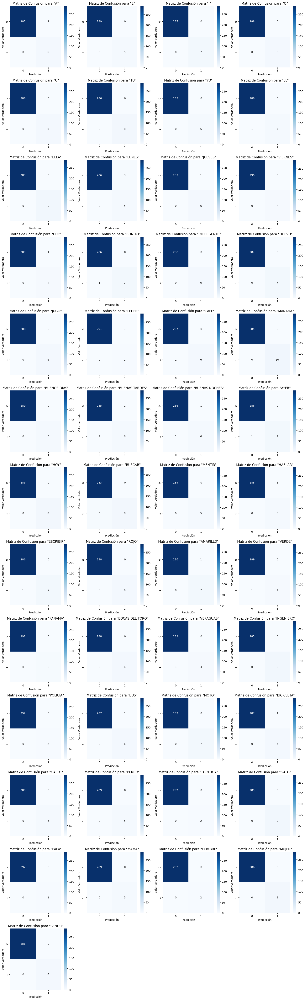

In [28]:
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import multilabel_confusion_matrix

mcm = multilabel_confusion_matrix(ytrue, yhat)

l = list(set(labels))
num_clases = len(l)
cols = 4  # Máximo de columnas por fila
rows = math.ceil(num_clases / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))

# Asegurarse de que `axes` sea siempre una matriz 2D
axes = np.array(axes).reshape(rows, cols)

for idx, matrix in enumerate(mcm):
    r, c = divmod(idx, cols)
    ax = axes[r, c]
    sns.heatmap(matrix, annot=True, fmt="d", ax=ax, cmap="Blues")
    ax.set_title(f'Matriz de Confusión para "{actions[l[idx]]}"')
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Valor Verdadero')

# Oculta ejes vacíos si hay menos clases que subplots
for idx in range(num_clases, rows * cols):
    r, c = divmod(idx, cols)
    fig.delaxes(axes[r, c])

plt.tight_layout()
plt.show()